<a href="https://colab.research.google.com/github/apsadewa/Steganography/blob/main/Main_RDH_(on_progress).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install and Import

In [ ]:
# https://stackoverflow.com/questions/26678132/python-numpy-subtraction-no-negative-numbers-4-6-gives-254
# https://www.pythoncentral.io/hashing-strings-with-python/
# https://medium.com/srm-mic/all-about-structural-similarity-index-ssim-theory-code-in-pytorch-6551b455541e#54f7

In [ ]:
!pip install img2pdf
!pip install pdf2img
!sudo apt-get install poppler-utils

  Using cached pdf2img-0.1.2-py3-none-any.whl
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
poppler-utils is already the newest version (22.02.0-2ubuntu0.4).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [ ]:
!sudo apt install tesseract-ocr libtesseract-dev libleptonica-dev pkg-config
!pip install tesserocr
!pip install db-sqlite3
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following packages were automatically installed and are no longer required:
  libbz2-dev libpkgconf3 libreadline-dev
Use 'sudo apt autoremove' to remove them.
The following additional packages will be installed:
  libarchive-dev tesseract-ocr-eng tesseract-ocr-osd
The following packages will be REMOVED:
  pkgconf r-base-dev
The following NEW packages will be installed:
  libarchive-dev libleptonica-dev libtesseract-dev pkg-config tesseract-ocr
  tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 7 newly installed, 2 to remove and 45 not upgraded.
Need to get 8,608 kB of archives.
After this operation, 31.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 pkg-config amd64 0.29.2-1ubuntu3 [48.2 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 libarchive-dev amd64 3.6.0-1ubuntu1.1 [582 kB]
Get:3 http://archive.ubuntu.com/ubun

In [ ]:
# from image_slicer import slice
import cv2
from google.colab.patches import cv2_imshow
import pandas as pd
import numpy as np
from math import log10, sqrt, floor
from PIL import Image
import matplotlib.image as mpimg
import hashlib
import uuid

from numba import njit

from numba.typed import List

from skimage.metrics import structural_similarity as ssim

import matplotlib.pyplot as plt
import os
import time

import sqlite3
import pandas as pd

from google.colab import drive
#drive.mount('/content/drive')

path = "/content/drive/MyDrive/TA/Code/Dataset/Pengujian/"
realpath = "/content/drive/MyDrive/TA/Code/Dataset/Pengujian/Refrensi/"
data_url = "https://docs.google.com/spreadsheets/d/1dWyK1rubUljef-sdnRs2xb5I6s9GCZFKSkWHiBpsC5Q/edit?usp=sharing"


# Embed Function

In [ ]:
def createDB(dbname):
  db = sqlite3.connect(dbname+".db")
  db.execute("drop table if exists validation")
  try:
    db.execute("create table validation(id,seed)")
  except:
    print("Table Already Exists !!!")

def insertData(id, seed):
  db = sqlite3.connect("val.db")
  cek = "SELECT id FROM validation WHERE id='{}'".format(id)
  rs = db.execute(cek).fetchall()
  if len(rs) == 0:
    cmd = "insert into validation(id,seed) values('{}','{}')".format(id,seed)
  else:
    cmd = "UPDATE validation set seed = '{}' where id = '{}'".format(seed,id)
  db.execute(cmd)
  db.commit()
  # print(db.execute("SELECT * FROM validation").fetchall())

db = createDB("val")


In [ ]:
@njit
def toModthree(value):
  if (value%3 == 1):
    value-=1
  elif(value%3 == 2):
    value+=1
  return value

In [ ]:
def SubBlockImage(img, height, width):
  block = []
  for i in range(height):
    k=0
    for j in range(3,width+3, 3): # Membagi setiap baris menjadi blok-blok dengan lebar 3
      block.append(img[i,k:j])
      #print(img[i,k:j])
      k+=3
  block = np.asarray(block)
  return block

In [ ]:
@njit(fastmath=True)
def binarySearch (arr, l, r, x):
    if r >= l:
        mid = l + (r - l) // 2
        if arr[mid] == x:
            return True
        elif arr[mid] > x:
            return binarySearch(arr, l, mid-1, x)
        else:
            return binarySearch(arr, mid + 1, r, x)
    else:
        return False

@njit(fastmath=True)
def calculateBlock(pixels):
  s=0
  for i in range(len(pixels)):
    s+=pixels[i]
  return int(s*100)

@njit(fastmath=True)
def OverUnder_Flow_Handle(block, idx):
  L=[]
  S=[]
  for j in range(len(block)):
    k = 0
    p=0
    flag = binarySearch(idx, 0, len(idx)-1, j)
    for i in range(9):

      if(i%3==0 and i!=0):
        k+=1
      if flag:
        p+=block[j,k,i%3]/255

      if(block[j,k,i%3] == 0):
        block[j,k,i%3] = 1
        L.append(1)

      elif(block[j,k,i%3] == 255):
        block[j,k,i%3] = 254
        L.append(1)

      elif(block[j,k,i%3] == 1 or block[j,k,i%3] == 254):
        L.append(0)

    if flag:
      S.append(int(p*100))
  return L, S, block

In [ ]:
def generateRandInd(lenSubBlock, seed=None):
  idx = []
  if not seed:
    seed = int(np.random.uniform(0,9999))
  rng = np.random.default_rng(seed)
  for i in range(lenSubBlock):
    if(rng.random() > 0.99):
      idx.append(i)
  return List(idx), seed

def generateRandEmb(ids, lenSubBlock, seed):
  # print("MASUK KE RANDEMBD")
  # print(ids, lenSubBlock, seed)
  rng = np.random.default_rng(seed)
  a = [i for i in range(ids+1,lenSubBlock)]
  # print("ids {}, len {}, seed {}".format(ids, lenSubBlock, seed))
  idx = rng.choice(a,len(a), replace=False)
  # print(idx)
  return List(idx)

  #ada index buat di sum
  #ad index buat embed

Penggunaan 0.99 sebagai ambang batas dalam rng.random() > 0.99 adalah cara untuk mengontrol probabilitas pemilihan indeks secara acak dengan frekuensi rendah, dalam hal ini 1%. Ini berguna dalam aplikasi di mana kita ingin menyisipkan atau memproses hanya sebagian kecil dari total data secara acak.

Jika perubahan pada data asli harus minimal untuk menghindari deteksi atau untuk mempertahankan kualitas data asli (misalnya dalam gambar atau audio), maka menyisipkan data pada persentase kecil (1%) dapat membantu dalam meminimalkan gangguan atau degradasi kualitas.

In [ ]:
x, y = generateRandInd(500)
print (x)
print(len(x))
print(y)

[0, ...]
1
9081
[2, 36, 325, 354, 356, 413, ...]
6
2634


In [ ]:
@njit
def differencePixel(C1, subBlocks):
  C1 = C1.astype(np.int16)
  for i in range(len(C1)):
    k = 0
    x = subBlocks[i,k+1,1]
    for j in range(9):
      # print(i, k , j)
      if(j%3==0 and j!=0):
        k+=1
      if(j%3==1 and k==1):
        C1[i,k,j%3] = x
      else:
        C1[i,k,j%3] -= x
  return C1

In [ ]:
def InData(number, S, L):
  strS = ''.join([str(bin(x))[2:].zfill(10) for x in S])
  strL = ''.join(map(str,L))
  sep = ''.join(format(i, '08b') for i in bytearray("|", encoding ='utf-8')).zfill(10) + ''.join(format(i, '08b') for i in bytearray(">", encoding ='utf-8')).zfill(10)
  print("sep:", sep)
  data =  number +"|"
  # print("number :",number)
  bindata = ''.join(format(i, '08b') for i in bytearray(data, encoding ='utf-8'))
  # print(bindata)
  mergedata = bindata + strS + sep + strL
  mergedataInt = List(list(map(int, [bit for bit in mergedata])))
  return mergedataInt

def stringTobit(string):

  bindata = ''.join(format(i, '08b') for i in bytearray(string, encoding ='utf-8'))
  return list(map(int, [bit for bit in bindata]))
#seed masukin DB

In [ ]:
print(stringTobit("1"))

[0, 0, 1, 1, 0, 0, 0, 1]
[0, 0, 1, 1, 0, 0, 0, 1]


In [ ]:
@njit
def embedding(C1, D, embidx, data, pr, pl):
  #embidx
  #pr pl
  counterData = 0
  for index in range(len(embidx)):
    i = embidx[index]
    k = 0
    for j in range(9):
      if(j%3==0 and j!=0):
        k+=1
#embidx: Daftar indeks untuk menyisipkan data

      if(j%3==1 and k==1):
          C1[i,k,j%3] += 0
      elif(counterData < len(data)):

        if(D[i,k,j%3] < pl):
          C1[i,k,j%3] -= 1
        elif(D[i,k,j%3] == pl):
          C1[i,k,j%3] -= data[counterData]
          counterData += 1
        elif(D[i,k,j%3] == pr):
          C1[i,k,j%3] += data[counterData]
          counterData += 1
        elif(D[i,k,j%3] > pr):
          C1[i,k,j%3] += 1

      elif(counterData >= len(data)):
        if(D[i,k,j%3] <= pl):
          C1[i,k,j%3] -= 1
        elif(D[i,k,j%3] >= pr):
          C1[i,k,j%3] += 1
        counterData+=1
  return C1

In [ ]:
@njit
def embeddingID(C1, D, data):
  counterData = 0
  for i in range(len(C1)):
    k = 0
    for j in range(9):
      if(j%3==0 and j!=0):
        k+=1

      if(j%3==1 and k==1):
          C1[i,k,j%3] += 0
      elif(counterData < len(data)):
        if(D[i,k,j%3] < -1):
          C1[i,k,j%3] -= 1
        elif(D[i,k,j%3] == -1):
          C1[i,k,j%3] -= data[counterData]
          counterData += 1
        elif(D[i,k,j%3] == 0):
          C1[i,k,j%3] += data[counterData]
          counterData += 1
        elif(D[i,k,j%3] > 0):
          C1[i,k,j%3] += 1

      elif(counterData >= len(data)):
        return C1, i

In [ ]:
def stackImage(C2_Block, height, width):
  index1 = 0
  index2 = width//3
  z = list()
  for i in range(height):
    z.append(np.reshape(C2_Block[index1:index2],(width,3)))
    index1 = index2
    index2 += width//3
  return np.array(z)

In [ ]:
@njit
def PSNR(original, embedded):
    mse = np.mean((original - embedded) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

In [ ]:
def Embedding(img, id, number):
  height, width = img.shape[0], img.shape[1]
  height, width = toModthree(height), toModthree(width)
  img = cv2.resize(img, (width,height))
  print("Shape", img.shape)

  subBlock = SubBlockImage(img, height, width)
  #print (subBlock)
  Lidx, seed = generateRandInd(len(subBlock))
  print("restidx: ",len(Lidx),Lidx)
  print("seed awal : ",seed)
  mapL, mapS, C = OverUnder_Flow_Handle(subBlock, Lidx)
  print("seed:",seed)
  insertData(id, seed)
  print("mapS :",len(mapS),mapS)
  print("mapL :",len(mapL),mapL)

  embid = stringTobit(id)
  # print(embid)
  data = InData(number, mapS, mapL)
  print("Data :", data)
  subCopy = C.copy()
  D = differencePixel(subCopy, C)
  plt.hist(D.ravel(),256,[0,256]); plt.show() #membuat histogram dari nilai-nilai piksel dalam D yang telah diratakan (mengubah array multi-dimensi menjadi satu dimensi).
  pr, pl = getpeakvalue(D, data)
  print(pr,pl)
  pp=""

  if(pr < 0):
    pr_fix = abs(pr)
    pl_fix = abs(pl)
    pp += "11"
  elif(pl < 0):
    pl_fix = abs(pl)
    pr_fix = pr
    pp += "01"
  else:
    pr_fix = pr
    pl_fix = pl
    pp += "00"

  pp += format(pr_fix, "b").zfill(8) #menambahkan representasi biner dari pr_fix ke pp, dengan panjang 8 bit (dengan padding nol di depan jika diperlukan)
  pp += format(pl_fix, "b").zfill(8)

  pp = list(map(int, pp)) #mengubah string pp menjadi daftar integer (bit)
  # pp = list(map(int, [i for i in format(pr, "b").zfill(8) + format(pl, "b").zfill(8)]))
  print("pp", pp)

  C1s, idx = embeddingID(C.copy(), D, List(embid+pp)) #Memanggil fungsi embeddingID untuk menyisipkan bit ID (embid + pp) ke dalam matriks C dan D
  showcapacity(D, data, idx, pr, pl)

  print("idx: ",idx)
  print("len sub: ",len(subBlock))
  print("seed :", seed)
  idx = generateRandEmb(idx, len(subBlock), seed)
  # print(idx[:10])
  # unique, counts = np.unique(idx, return_counts=True)
  # print(dict(zip(unique, counts)))

  C2 = embedding(C1s.copy(), D, idx, data, pr, pl)
  embed_image = stackImage(C2, height, width)

  #https://stackoverflow.com/questions/62293077/why-is-pils-image-fromarray-distorting-my-image-color
  # Image.fromarray(cv2.cvtColor(embed_image, cv2.COLOR_BGR2RGB)).save("Embedded.pdf")
  return cv2.imwrite("Embedded.png", embed_image)

def getpeakvalue(difblock, data):
  unique, counts = np.unique(difblock, return_counts=True)
  dicts = dict(zip(unique, counts))
  print("dblock: ",difblock)
  print("dicts:", dicts)
  getTwopeak = sorted(((v,k) for k,v in dicts.items()))[-2:] #membuat generator yang menghasilkan pasangan (frekuensi, nilai) dan mengurutkan pasangan berdasarkan frekuensi dalam urutan menaik dan mengambil dua elemen terakhir (dua nilai dengan frekuensi tertinggi)
  if(getTwopeak[0][1] > getTwopeak[1][1]): #menetapkan pr (nilai puncak tertinggi) dan pl (nilai puncak terendah)
    pr = getTwopeak[0][1]
    pl = getTwopeak[1][1]
  else:
    pr = getTwopeak[1][1]
    pl = getTwopeak[0][1]
  print(getTwopeak[0][0],getTwopeak[0][1], getTwopeak[1][0], getTwopeak[1][1],"pr: ", pr, "pl :",pl)
  return pr, pl

def showcapacity(difblock, data, idxID, pr, pl):
  uniqueID, countsID = np.unique(difblock[:idxID], return_counts=True)
  dictsID = dict(zip(uniqueID, countsID))

  capacityID = dict(zip(uniqueID, countsID))[0]
  try:
    capacityID+=+ dict(zip(uniqueID, countsID))[-1]
  except:
    pass

  uniqueDATA, countsDATA = np.unique(difblock[idxID+1:], return_counts=True)
  dictsDATA = dict(zip(uniqueDATA, countsDATA))
  capacityDATA = dict(zip(uniqueDATA, countsDATA))[pr] + dict(zip(uniqueDATA, countsDATA))[pl]

  print("Capacity ID :", capacityID)
  print("Capacity Data : ", capacityDATA)
  print("Total Capacity : ", capacityID + capacityDATA," Length Data : ",len(data), (capacityID + capacityDATA)>len(data))

In [ ]:
#seed="1234"
#nama="Budi"
#img = cv2.imread("/content/drive/MyDrive/TA/Code/Dataset/Pengujian/Refrensi/1.jpg")
#height, width = img.shape[0], img.shape[1]
#height, width = toModthree(height), toModthree(width)
#img = cv2.resize(img, (width,height))
#print("Shape", img.shape)
#subBlock = SubBlockImage(img, height, width)
#Lidx, seed = generateRandInd(len(subBlock))
#print("restidx: ",(Lidx))
#print("seed awal : ",seed)
#mapL, mapS, C = OverUnder_Flow_Handle(subBlock, Lidx)
#print("seed:",seed)
#print("Map L:",mapL,"Map S:", mapS)



```
# Note
- pr dan pl adalah nilai puncak histogram yang menentukan lokasi dalam histogram untuk penyisipan data.
- pp adalah representasi biner dari pr dan pl yang disisipkan ke dalam gambar untuk memastikan nilai puncak dapat diidentifikasi kembali saat ekstraksi.
- Nilai puncak digunakan untuk mengurangi distorsi visual dan menjaga integritas data yang disisipkan.
```



# Run Embed

In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive',force_remount=True)

# Tetapkan path
realpath = "/content/drive/MyDrive/TA/Code/Dataset/Pengujian/Refrensi"
subdir = realpath + "/"

# Periksa apakah path ada
if os.path.exists(subdir):
    try:
        # Ambil dan sortir daftar file
        imgList = sorted(os.listdir(subdir), key=lambda x: int(x.split('.')[0]))
        print("List of images:", imgList)
    except Exception as e:
        print(f"Error accessing directory: {e}")
else:
    print(f"Subdirectory does not exist: {subdir}")

    # Daftar isi direktori utama untuk debugging
    if os.path.exists(realpath):
        print("Contents of the main directory:")
        print(os.listdir(realpath))
    else:
        print(f"Main directory does not exist: {realpath}")


Mounted at /content/drive
List of images: ['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg', '5', '6.jpg', '7.jpg', '8.jpg', '9.jpg', '10.jpg', '11.jpg', '12.jpg', '13.jpg', '14.jpg']
Mounted at /content/drive
List of images: ['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg', '5', '6.jpg', '7.jpg', '8.jpg', '9.jpg', '10.jpg', '11.jpg', '12.jpg', '13.jpg', '14.jpg']


In [ ]:
img = cv2.imread("/content/drive/MyDrive/TA/Code/Dataset/Pengujian/Refrensi/1.jpg")

width, height = 1280, 720
img = cv2.resize(img, (width,height))

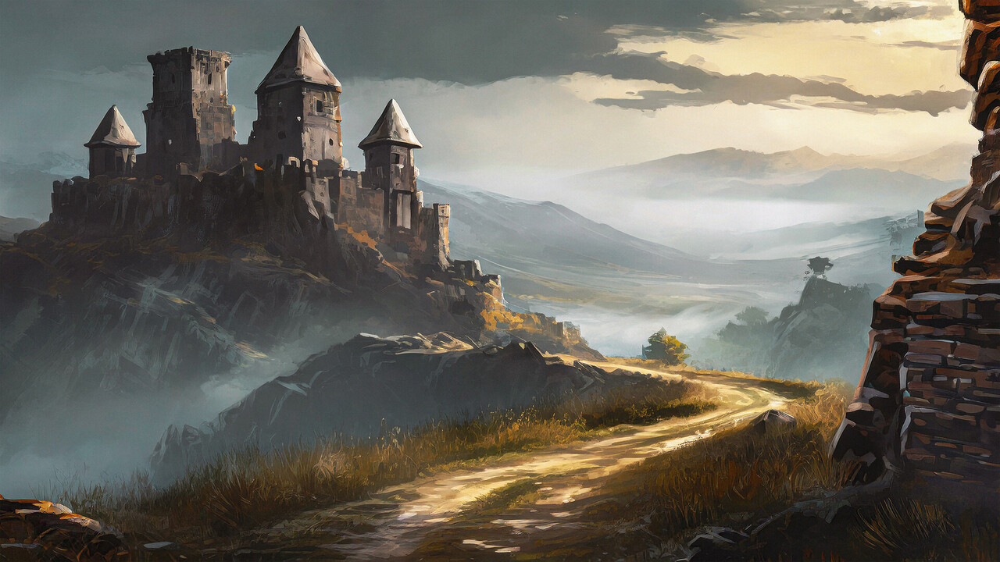

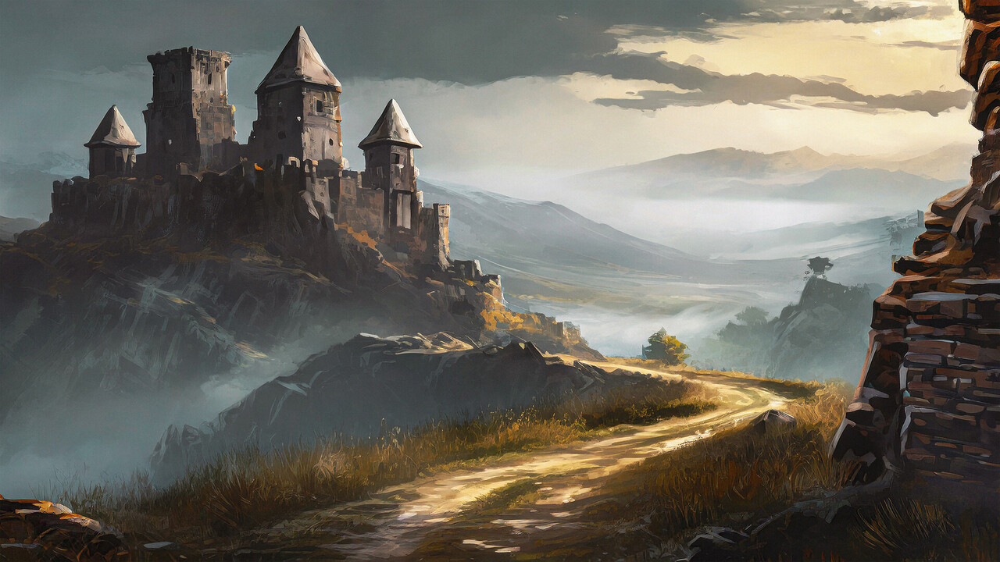

In [ ]:
cv2_imshow(img)

Shape (720, 1281, 3)
restidx:  3116 [129, 214, 228, 313, 336, 567, 741, 944, 1070, 1096, 1118, 1143, 1376, 1410, 1449, 1573, 2075, 2082, 2210, 2289, 2334, 2454, 2467, 2498, 2527, 2643, 2653, 2829, 2868, 3228, 3248, 3256, 3285, 3328, 3336, 3436, 3460, 3476, 3499, 3514, 3733, 3778, 4245, 4377, 4510, 4556, 4578, 4742, 4853, 5227, 5339, 5491, 5964, 6053, 6164, 6167, 6260, 6319, 6320, 6485, 6547, 6553, 6556, 6700, 6901, 6987, 7190, 7193, 7225, 7318, 7342, 7608, 7681, 7958, 7986, 8033, 8156, 8298, 8350, 8474, 8561, 8743, 8767, 8815, 8975, 9047, 9225, 9262, 9344, 9719, 9731, 9760, 9781, 10089, 10114, 10132, 10509, 10554, 10587, 10664, 10738, 10814, 10938, 11056, 11101, 11153, 11183, 11242, 11346, 11482, 11506, 11573, 11682, 11690, 11695, 11788, 11878, 11916, 12022, 12059, 12152, 12351, 12485, 12488, 12540, 12802, 12842, 12860, 13025, 13309, 13319, 13354, 13542, 13599, 13952, 14145, 14289, 14312, 14409, 14453, 14520, 14547, 14548, 14560, 14658, 14732, 14780, 14796, 14833, 14926, 15044, 15169, 

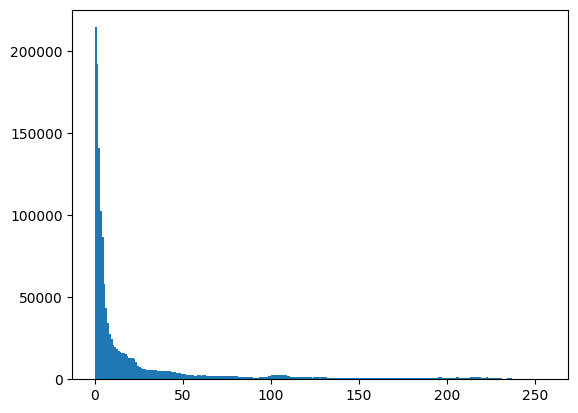

dblock:  [[[  1   0 -14]
  [  1  96 -14]
  [  2   1 -13]]

 [[  1   0 -14]
  [  0  99 -16]
  [ -1  -1 -17]]

 [[ -1  -1 -17]
  [  0  99 -16]
  [ -1  -1 -17]]

 ...

 [[-15  -6   4]
  [-12  39   6]
  [ -9   1   8]]

 [[ -3   4  13]
  [ -5  35   9]
  [ -6  -3   5]]

 [[ -1  -1   5]
  [  1  32   2]
  [  0   0   0]]]
dicts: {-188: 1, -178: 2, -176: 1, -174: 1, -173: 1, -168: 1, -167: 2, -166: 1, -163: 1, -162: 1, -159: 1, -157: 1, -156: 5, -154: 2, -153: 3, -152: 4, -151: 2, -150: 4, -149: 1, -148: 2, -147: 2, -146: 3, -145: 5, -144: 3, -143: 4, -142: 4, -141: 6, -140: 6, -139: 3, -138: 2, -137: 5, -136: 3, -135: 4, -134: 4, -133: 6, -132: 2, -131: 13, -130: 5, -129: 8, -128: 6, -127: 5, -126: 7, -125: 7, -124: 12, -123: 7, -122: 6, -121: 19, -120: 14, -119: 16, -118: 10, -117: 10, -116: 10, -115: 10, -114: 15, -113: 14, -112: 12, -111: 19, -110: 23, -109: 20, -108: 17, -107: 18, -106: 29, -105: 28, -104: 35, -103: 37, -102: 48, -101: 57, -100: 54, -99: 47, -98: 59, -97: 66, -96: 81, -95: 

True

In [ ]:
id = "1301202172"
# number = "1"*37500
number = "1"*4000
# number = "714732021000001"

%time Embedding(img, id, number)



```
Histogram dari gambar mencerminkan distribusi intensitas piksel dalam gambar tersebut. Dengan memvisualisasikan histogram, kita dapat melihat frekuensi kemunculan masing-masing nilai piksel.
```



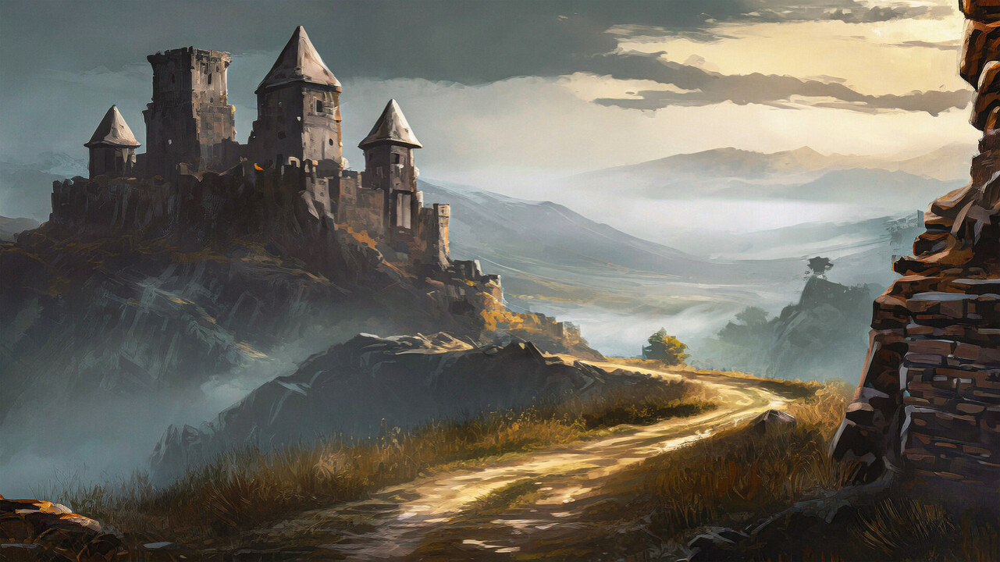

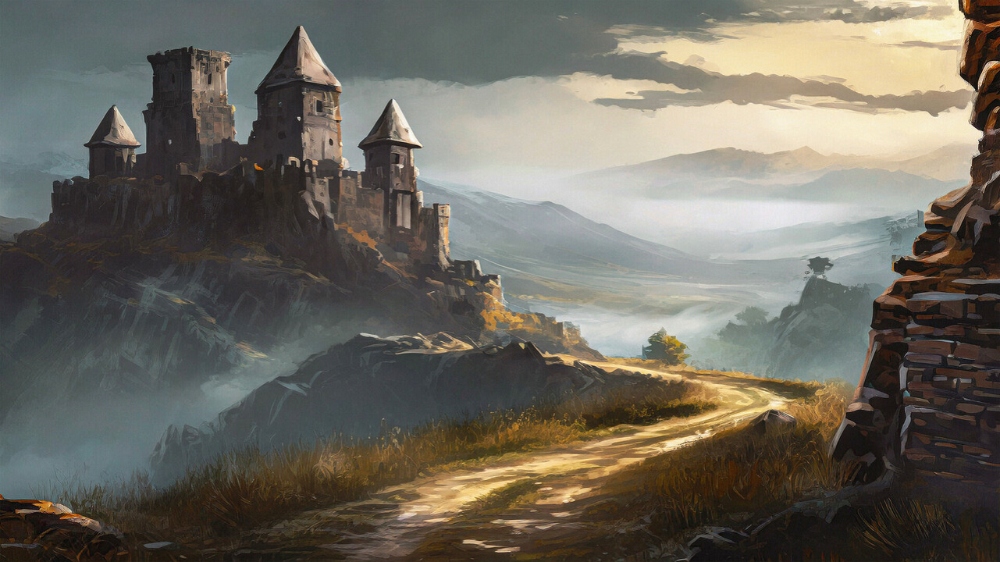

In [ ]:
cv2_imshow(cv2.imread("/content/Embedded.png"))

In [ ]:
!ls -s

total 1476
   4 drive  1460 Embedded.png     4 sample_data     8 val.db
total 1476
   4 drive  1460 Embedded.png     4 sample_data     8 val.db


# Extraction

In [ ]:
@njit
def bitExtraction(C1, subBlock, embidx, pr, pl):
  bits = []
  C1 = C1.astype(np.int16)
  for index in range(len(embidx)):
    i = embidx[index]
    k = 0
    x = subBlock[i,k+1,1]
    for j in range(9):
      #print(i, k , j)
      if(j%3==0 and j!=0):
        k+=1
      if(j%3==1 and k==1): # inisialisasi nilai tengah
        C1[i,k,j%3] = x
      else:
        value = C1[i,k,j%3] - x # mengurangi block lain dengan nilai tengah subblock

        if(value == pr-1 or value == pl+1):
          #print("a")
          bits.append(0)
        elif(value == pr or value == pl):
          #print("b")
          bits.append(1)

        if(value > pr-1): #dalam case ini pr-1: 1-1 = 0
          C1[i,k,j%3] -= 1
        elif(value<pl+1):
          C1[i,k,j%3] += 1 #dalam case ini pl+1: 0+1 = 1

  return bits, C1

In [ ]:
@njit
def bitExtractionID(C1, subBlock):
  counter = 0
  c2=0
  bits = []
  id=""
  print("C1: ",len(C1))
  C1 = C1.astype(np.int16)
  for i in range(len(C1)):
    k = 0
    x = subBlock[i,k+1,1]
    for j in range(9):
      # print(i, k , j)
      if(j%3==0 and j!=0):
        k+=1
      if(j%3==1 and k==1): #nilai tengah subblock
        C1[i,k,j%3] = x
      else:
        value = C1[i,k,j%3] - x #mengurangi nilai block lain dengan nilai tengah pada subblock

        if(value == 0 or value == -1):
          bits.append(0)
          counter+=1 #melacak jumlah bit yang diekstraksi dari blok gambar yang diberikan
        elif(value == 1 or value == -2):
          bits.append(1)
          counter+=1

        if(value > 0):
          C1[i,k,j%3] -= 1
        elif(value < -1):
          C1[i,k,j%3] += 1

      if(len(bits) == (8*12)+2): #jika panjang bits 98
        counter = 0
        c2+=1


        return bits[:len(bits)], C1, i

In [ ]:
# mengubah string biner menjadi string teks
def text_from_bits(bits, encoding='utf-8', errors='surrogatepass'):
    #print("bits :",type(bits),len(bits),bits)
    n = int(bits,2)
    #print("n :", n)
    return n.to_bytes((n.bit_length() + 7) // 8, 'big').decode(encoding, errors) or '\0'

In [ ]:
x = "0011000100110001"
#n= 417438461836361905078336
n=int(x,2)
print(n.bit_length)
y= n.to_bytes((n.bit_length() + 7) // 8, 'big').decode(encoding='utf-8', errors='surrogatepass')
print(y)


<built-in method bit_length of int object at 0x7fad89222ed0>
11
<built-in method bit_length of int object at 0x7fad8ab4c150>
11


**Penjelasan** fungsi text_from_bits

```
*   n.to_bytes((n.bit_length() + 7) // 8, 'big'): Mengubah integer n menjadi objek bytes. Jumlah bytes ditentukan oleh panjang bit dari n (n.bit_length()) ditambah 7, dibagi 8 (perhitungan ini memastikan cukup bytes untuk merepresentasikan bit). Format 'big' endian digunakan, artinya byte paling signifikan ada di awal.
*   .decode(encoding, errors): Mendekode objek bytes menjadi string menggunakan encoding dan skema errors yang ditentukan.
*   or '\0': Jika hasil decoding adalah string kosong, maka akan mengembalikan karakter null '\0'.

```



In [ ]:
def convertExtracted(extract_data):
  # print("Panjanga Ekstark", len(extract_data))
  data = {
      "number":""
  }
  sepCount=0 #penghitung untuk pemisah (separator) yang ditemukan (dalam hal ini karakter |)
  copy_extract = extract_data.copy()

  for i in extract_data:
    # print(data)
    # try:
    if (text_from_bits(i) == "|"):
      # print("asda",i)
      copy_extract.pop(0) #jika hasil konversi biner ke teks adalah karakter |, maka elemen tersebut dihapus dari copy_extract dan sepCount ditambah 1
      sepCount+=1
      if (sepCount==1):
        break
    else:
      # print(text_from_bits(i))
      data[[*data][sepCount]]+=text_from_bits(i) #jika elemen tersebut bukan pemisah, hasil konversi biner ke teks ditambahkan ke nilai dari kunci saat ini dalam data
      copy_extract.pop(0) #elemen tersebut juga dihapus dari copy_extract
    # except:
    #   print(i)
    #   print(text_from_bits(i))

  return data, copy_extract

def convertID(bits):
  text="" #string kosong untuk menyimpan hasil konversi
  for i in bits:
    text+=text_from_bits(i) #melakukan iterasi melalui setiap elemen dalam bits dan menambahkan hasil konversi biner ke teks ke dalam text
  return text

**Penjelasan**
```
*   convertExtracted: Mengonversi data biner yang diekstraksi menjadi dictionary yang berisi teks sampai ditemukan pemisah |. Fungsi ini juga mengembalikan sisa data yang belum diproses.
*   convertID: Mengonversi daftar biner sepenuhnya menjadi teks.


```



In [ ]:
def DivideMap(extr_data):
  mapS=[]
  extr_data = [extr_data[i:i+10] for i in range(0, len(extr_data), 10)] #data biner dipecah menjadi potongan-potongan kecil yang masing-masing berukuran 10 bit.
  extr_data_new = extr_data.copy()
  for i in range(len(extr_data)):
    try:
      if (text_from_bits(extr_data[i])=="|" and text_from_bits(extr_data[i+1])==">"):
        extr_data_new.pop(0)
        extr_data_new.pop(0)
        mapL = ''.join(extr_data_new)
        mapL = list(map(int, [bit for bit in mapL]))
        break
    except:
      pass
    mapS.append(int(extr_data[i],2))
    extr_data_new.pop(0)
  return mapS, mapL

**Penjelasan**

```
*   Dalam setiap iterasi, fungsi mencoba memeriksa apakah dua potongan berturut-turut (10 bit masing-masing) setelah dikonversi menjadi teks adalah | dan >.
*   Jika ditemukan, dua potongan tersebut dihapus dari extr_data_new, dan sisa data setelah pemisah |> diubah menjadi daftar bit (mapL), lalu loop dihentikan.
*   Jika tidak ditemukan, potongan data saat ini dikonversi dari biner ke bilangan bulat dan ditambahkan ke mapS. Potongan tersebut kemudian dihapus dari extr_data_new.
```


```
fungsi DivideMap memproses data biner dalam potongan-potongan 10 bit, mencari pemisah |>, dan membagi data menjadi dua bagian:

mapS: Bagian awal data yang dikonversi menjadi bilangan bulat hingga menemukan pemisah |>.
mapL: Sisa data setelah pemisah |> yang diubah menjadi daftar bit.
```




In [ ]:
@njit(fastmath=True)
def fullyRestored(res_im, mapL, idx, resMapS):
  #counter, counterS: Digunakan untuk melacak posisi dalam mapL dan resMapS
  counter = 0
  counterS = 0
  valid=True
  for i in range(len(res_im)):
    k = 0
    p = 0
    flag = binarySearch(idx, 0, len(idx)-1, i) #flag digunakan untuk menentukan apakah indeks saat ini i dari array res_im ada dalam daftar indeks idx
    for j in range(9):
      if(j%3==0 and j!=0):
        k+=1

      if not valid:
        # print(res_im[i])
        res_im[i,k,j%3]=np.random.uniform(0,255) #ganti nilai piksel saat ini dengan nilai acak antara 0 dan 255
        # valid=True

      if(res_im[i,k,j%3] == 254 and mapL[counter]==1):
        res_im[i,k,j%3]=255
        counter+=1

      elif(res_im[i,k,j%3] == 1 and mapL[counter]==1):
        res_im[i,k,j%3]=0
        counter+=1

      elif((res_im[i,k,j%3] == 254 or res_im[i,k,j%3] == 1) and mapL[counter]==0):
        counter+=1

      if flag:
        p+=res_im[i,k,j%3]/255 #Setiap nilai piksel res_im[i, k, j % 3] dinormalisasi ke rentang [0, 1] dengan membaginya dengan 255
    if flag and valid:
      # print(int(p*100)==resMapS[counterS], int(p*100), resMapS[counterS])
      # if(int(p*100) - resMapS[counterS] ==1):
      #   pass
      valid = int(p*100)==resMapS[counterS] #periksa apakah jumlah terakumulasi p cocok dengan nilai yang sesuai dalam resMapS (diskalakan menjadi persentase). Perbarui valid sesuai.
      counterS+=1

  return res_im

In [ ]:
def getSeed(id):
  db = sqlite3.connect("val.db")
  cmd = "SELECT * FROM validation WHERE id='{}'".format(id)
  rs = db.execute(cmd).fetchall()
  if len(rs) > 0:
    return rs[0][1]
  return None

In [ ]:
def Extraction(emb_img):
  size = (emb_img.shape[0], emb_img.shape[1])
  block_embed_image = SubBlockImage(emb_img, size[0], size[1]) #memecah gambar menjadi blok-blok kecil menggunakan fungsi subBlockImage
  print(len(block_embed_image))

  ### Baruu
  subCopy = block_embed_image.copy()

  D_emb = block_embed_image.copy()
  print("bext")
  firstdata, D_embs, i = bitExtractionID(D_emb, block_embed_image) #mngekstraksi data awal dari blok-blok gambar
  print("af")
  print("firstdata:", len(firstdata), firstdata)
  print("i :",i)
  # i+=1
  # print("bit id: ", id)
  # print(firstdata)
  id = text_from_bits(''.join(map(str,firstdata[:80]))) #mengubah 80 bit pertama dari firstdata menjadi teks untuk mendapatkan ID
  print("id :",id)
  firstdata_strlist = ''.join(map(str, firstdata[80:])) #mengubah sisa firstdata menjadi string biner
  print("firstdata_strlist :",firstdata_strlist)

  if(firstdata_strlist[0] == '1'):
    print("11")
    pr = 0 - (int(firstdata_strlist[2:10],2) + 1)
    pl = 0 - (int(firstdata_strlist[10:],2) - 1)
  elif(firstdata_strlist[0] == '0' and firstdata_strlist[1] == '1'):
    print("01")
    print(firstdata_strlist[10:]) #Cetak juga sisa bit setelah bit ke-10
    pr = int(firstdata_strlist[2:10],2) + 1
    pl = 0 - (int(firstdata_strlist[10:],2) + 1)
  else:
    print("00")
    pr = int(firstdata_strlist[2:10],2) + 1
    pl = int(firstdata_strlist[10:],2) - 1
  print("PR PL :",pr,pl)
  # print("id: ", id)
  id_seed = getSeed(id)
  print("seed: ",id_seed)
  try: #mencoba menghasilkan indeks acak (residx) menggunakan seed yang dihasilkan dan mengekstraksi data dari blok-blok gambar
    residx = generateRandEmb(i, len(block_embed_image),int(id_seed))

    extracted_data, restored = bitExtraction(D_embs, block_embed_image, residx, pr, pl)
    text_from_bits(''.join(map(str,extracted_data[:8])))

  except: #mencoba kembali dengan nilai indeks yang diperbarui (i + 1)
    residx = generateRandEmb(i+1, len(block_embed_image),int(id_seed))
    extracted_data, restored = bitExtraction(D_embs, block_embed_image, residx, pr, pl)


  extracted_data_str = ''.join(map(str,extracted_data))
  print(extracted_data_str[:20])
  extracted_data_str = [extracted_data_str[j:j+8] for j in range(0, len(extracted_data_str), 8)]
  convert_data, extracted_data_new = convertExtracted(extracted_data_str)
  print("convert data :",len(convert_data), convert_data)
  print("extracted data :",len(extracted_data_new), extracted_data_new)

  extracted_data_new = ''.join(extracted_data_new)
  print("extracted data 2 :", len(extracted_data_new),extracted_data_new)

  exMapS, exMapL = DivideMap(extracted_data_new)
  print("tes")
  return convert_data, exMapS, exMapL, restored, size, int(id_seed)

def RestoreAndValidationStep1(id_seed, mapS, mapL, restored, size):
  index,_ = generateRandInd(len(restored), seed=id_seed)
  # print("restoridx: ", index[:10])
  # print("tioe",type(restored))
  full_restored = fullyRestored(restored.copy(),List(mapL), index, List(mapS))
  full_restored = stackImage(full_restored, size[0], size[1])
  return full_restored.astype('uint8')

from tesserocr import PyTessBaseAPI
import pytesseract

def readTextFromImg(img):
  custom_config = r'--oem 3 --psm 6'
  #--oem 3: Menentukan mode mesin OCR. Nilai 3 berarti menggunakan mode default yang mencoba menggunakan kombinasi dari LSTM dan model lama
  #--psm 6: Menentukan mode segmentasi halaman. Nilai 6 berarti Tesseract akan menganggap gambar sebagai blok teks tunggal dengan urutan teks yang variatif
  text = pytesseract.image_to_string(img, config=custom_config) #mengekstraksi teks dari gambar yang diberikan
  return text

def validationOCR(img, data):
  img = img[30:280] #Memotong bagian vertikal dari gambar, menyisakan piksel dari baris 30 hingga baris 280
  # cv2_imshow(img)
  # contours = imageprocessing(img)
  w = img.shape[1]
  h = img.shape[0]
  bpp = img.shape[2]


  img_bytes = img.tobytes()
  bpl = bpp * w

  # for cnt in contours:
  #   x, y, w, h = cv2.boundingRect(cnt)
  #   cropped = img[y:y + h, x:x + w]
    # img_bytes = cropped.tobytes()
    # text = pytesseract.image_to_string(cropped)
    # if text.find(data['number']) != -1:
    #   return True
  with PyTessBaseAPI() as api:
      api.SetImageBytes(
                      imagedata=img_bytes,
                      width=w,
                      height=h,
                      bytes_per_pixel=bpp,
                      bytes_per_line=bpl)

      text = api.GetUTF8Text()
      # print(text)

      # print(text)
  # textToFind2="Number:"
  # locateText2 = text.find(textToFind2)+len(textToFind2)
  # textToVal2 = text[locateText2:locateText2+23].strip()
  # print(textToVal2)
  # print(text)
  if text.find(data['number']) != -1:
    return True
  else:
    return False

In [ ]:
def getpeak(difblock):
  unique, counts = np.unique(difblock, return_counts=True)
  dicts = dict(zip(unique, counts))
  print("dict :", dict(zip(unique, counts)))
  getTwopeak = sorted(((v,k) for k,v in dicts.items()))[-2:] #Elemen-elemen disortir berdasarkan jumlah kemunculannya, dan dua elemen paling sering dipilih dan dicetak
  print(sorted(((v,k) for k,v in dicts.items()))[-8:]) #mencetak delapan elemen paling sering untuk memberikan informasi tambahan.

  if(getTwopeak[0][1] > getTwopeak[1][1]): #pr ditetapkan sebagai puncak yang lebih tinggi dan pl sebagai puncak yang lebih rendah
    pr = getTwopeak[0][1]
    pl = getTwopeak[1][1]
  else:
    pr = getTwopeak[1][1]
    pl = getTwopeak[0][1]
  return pr, pl

In [ ]:
def RealValidation(embedded_image):
  try:
    data, mapS, mapL, block_embed, size, seed = Extraction(embedded_image)
    # print(data)
    val = RestoreAndValidationStep1(seed, mapS, mapL, block_embed, size)
  except Exception as e:
    print(e)
    val = False

  if isinstance(val, bool): # jika val adlh false
    print("Seed Not Found")
    return "Image Not Valid"
  else:
    result = validationOCR(embedded_image, data) # memeriksa apakah data yang diekstrak sesuai dengan gambar yang di-embed
    if result:
      print(ssim(img,val, multichannel=True))
      return "Image Valid"
    else:
      print("Number Not Found")
      print("ssim :", ssim(img,val, multichannel=True)) #SSIM adalah metrik yang sangat berguna untuk mengukur kesamaan struktural antara dua gambar, mempertimbangkan pencahayaan, kontras, dan struktur gambar
      return "Image Not Valid"

In [ ]:
embedded_image = cv2.imread("/content/Embedded.png")

%time RealValidation(embedded_image)
# ids 43, len 942471, seed 7750

307440
bext
C1:  307440
af
firstdata: 98 [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
i : 63
id : 1301202172
firstdata_strlist : 000000000100000000
00
PR PL : 2 -1
seed:  5848
00110001001100010011
convert data : 1 {'number': '11111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111

RuntimeError: Failed to init API, possibly an invalid tessdata path: ./

307440
bext
C1:  307440
af
firstdata: 98 [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
i : 63
id : 1301202172
firstdata_strlist : 000000000100000000
00
PR PL : 2 -1
seed:  7028
00110001001100010011
convert data : 1 {'number': '11111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111111

RuntimeError: Failed to init API, possibly an invalid tessdata path: ./